### A. Get laser time

In [4]:
import numpy as np
import os
import pandas as pd
import spikeinterface as si
from spyglass.common import (Session, IntervalList,LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,DIOEvents)
import matplotlib.pyplot as plt

from spyglass.spikesorting import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording)

In [5]:
from ripple_detection import Kay_ripple_detector
from ripple_detection.core import (gaussian_smooth,
                                   get_envelope,
                                   get_multiunit_population_firing_rate,
                                   threshold_by_zscore,
                                   segment_boolean_series,
                                   exclude_close_events,
                                   exclude_movement,
                                   extend_threshold_to_mean)

In [6]:
def get_Kay_ripple_consensus_trace(ripple_filtered_lfps, sampling_frequency,
                                   smoothing_sigma=0.004):
    ripple_consensus_trace = np.full_like(ripple_filtered_lfps, np.nan)
    not_null = np.all(pd.notnull(ripple_filtered_lfps), axis=1)

    ripple_consensus_trace[not_null] = get_envelope(
        np.asarray(ripple_filtered_lfps)[not_null])
    ripple_consensus_trace = np.sum(ripple_consensus_trace ** 2, axis=1)
    ripple_consensus_trace[not_null] = gaussian_smooth(
        ripple_consensus_trace[not_null], smoothing_sigma, sampling_frequency)
    return np.sqrt(ripple_consensus_trace)

In [7]:
def threshold_by_zscore_Gu(data, time, minimum_duration=0.015,
                        zscore_threshold=2):
    '''Standardize the data and determine whether it is above a given
    number.

    Parameters
    ----------
    data : array_like, shape (n_time,)
    zscore_threshold : int, optional

    Returns
    -------
    candidate_ripple_times : pandas Dataframe

    '''
    zscored_data = zscore(data, nan_policy='omit')
    is_above_mean = zscored_data >= 0
    is_above_threshold = zscored_data >= zscore_threshold

    return extend_threshold_to_mean(
        is_above_mean, is_above_threshold, time,
        minimum_duration=minimum_duration)

def Gu_ripple_detector(time, filtered_lfps, speed, sampling_frequency,
                        speed_threshold=4.0, minimum_duration=0.015,
                        zscore_threshold=2.0, smoothing_sigma=0.004,
                        close_ripple_threshold=0.0):
    '''Find start and end times of sharp wave ripple events (150-250 Hz)
    based on Kay et al. 2016 [1].

    Parameters
    ----------
    time : array_like, shape (n_time,)
    filtered_lfps : array_like, shape (n_time, n_signals)
        Bandpass filtered time series of electric potentials in the ripple band
    speed : array_like, shape (n_time,)
        Running speed of animal
    sampling_frequency : float
        Number of samples per second.
    speed_threshold : float, optional
        Maximum running speed of animal for a ripple
    minimum_duration : float, optional
        Minimum time the z-score has to stay above threshold to be
        considered a ripple. The default is given assuming time is in
        units of seconds.
    zscore_threshold : float, optional
        Number of standard deviations the ripple power must exceed to
        be considered a ripple
    smoothing_sigma : float, optional
        Amount to smooth the time series over time. The default is
        given assuming time is in units of seconds.
    close_ripple_threshold : float, optional
        Exclude ripples that occur within `close_ripple_threshold` of a
        previously detected ripple.

    Returns
    -------
    ripple_times : pandas DataFrame

    References
    ----------
    .. [1] Kay, K., Sosa, M., Chung, J.E., Karlsson, M.P., Larkin, M.C.,
    and Frank, L.M. (2016). A hippocampal network for spatial coding during
    immobility and sleep. Nature 531, 185-190.

    '''
    filtered_lfps = np.asarray(filtered_lfps)
    not_null = np.all(pd.notnull(filtered_lfps), axis=1)
    filtered_lfps, speed, time = (
        filtered_lfps[not_null], speed[not_null], time[not_null])

    filtered_lfps = get_envelope(filtered_lfps)
    combined_filtered_lfps = np.sum(filtered_lfps ** 2, axis=1)
    combined_filtered_lfps = gaussian_smooth(
        combined_filtered_lfps, smoothing_sigma, sampling_frequency)
    combined_filtered_lfps = np.sqrt(combined_filtered_lfps)
    
    imobility_ind=np.logical_or(speed>speed_threshold,np.isnan(speed))
    combined_filtered_lfps[imobility_ind]=np.nan
    speed[imobility_ind]=np.nan
    time[imobility_ind]=np.nan
    
    candidate_ripple_times = threshold_by_zscore(
        combined_filtered_lfps, time, minimum_duration, zscore_threshold)
    ##### find threshold
    ripple_threshold=np.nanmean(combined_filtered_lfps
                               )+zscore_threshold*np.nanstd(combined_filtered_lfps)
    print(ripple_threshold)
    ###################
    ripple_times = exclude_movement(
        candidate_ripple_times, speed, time,
        speed_threshold=speed_threshold)
    ripple_times = exclude_close_events(
        ripple_times, close_ripple_threshold)
    index = pd.Index(np.arange(len(ripple_times)) + 1,
                     name='ripple_number')
    return pd.DataFrame(ripple_times, columns=['start_time', 'end_time'],
                        index=index)

In [8]:
nwb_file_name='isaac20230601_.nwb'

In [9]:
DIOEvents & {'nwb_file_name' :nwb_file_name}

nwb_file_name name of the NWB file,dio_event_name the name assigned to this DIO event,dio_object_id the object id of the data in the NWB file,interval_list_name descriptive name of this interval list
isaac20230601_.nwb,Laser,3dc9ace9-5a2d-4d9a-a2bf-c72fcaaacbcd,raw data valid times


In [141]:
Lasertime=(DIOEvents & {'nwb_file_name' :nwb_file_name}).fetch_nwb()

In [142]:
Lasertime

[{'nwb_file_name': 'isaac20230601_.nwb',
  'dio_event_name': 'Laser',
  'dio_object_id': '3dc9ace9-5a2d-4d9a-a2bf-c72fcaaacbcd',
  'interval_list_name': 'raw data valid times',
  'dio': Laser pynwb.base.TimeSeries at 0x139741012624576
  Fields:
    comments: no comments
    conversion: 1.0
    data: <HDF5 dataset "data": shape (104133,), type "|u1">
    description: Dout7
    interval: 1
    offset: 0.0
    resolution: -1.0
    timestamps: <HDF5 dataset "timestamps": shape (104133,), type "<f8">
    timestamps_unit: seconds
    unit: unspecified}]

In [143]:
laser_data=np.array(Lasertime[0]['dio'].data) #laser binary
laser_time=np.array(Lasertime[0]['dio'].timestamps) #laser time
laser_time

array([1.68565574e+09, 1.68565575e+09, 1.68565575e+09, ...,
       1.68566501e+09, 1.68566501e+09, 1.68566501e+09])

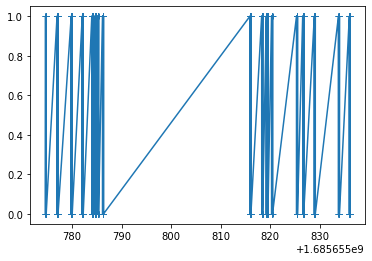

In [144]:
t0=1000
t1=2000
plottimes=(laser_time[t0],laser_time[t1])
plt.plot(laser_time[t0:t1],laser_data[t0:t1],'+-')

In [11]:
run_session=[]
for session in (IntervalList & {'nwb_file_name': nwb_file_name}).fetch('interval_list_name'):
    if (session[6:8]=='Hz') & ~('lfp' in session):
        run_session.append(session)
print(run_session)

['01_200Hz1ms33pulses', '02_150Hz1ms29pulses', '03_200Hz1ms33pulsesb', '04_150Hz1ms30pulses', '05_200Hz1ms33pulsesc']


In [12]:
interval_list_name=run_session[0]
valid_times=(IntervalList & {'nwb_file_name': nwb_file_name,
                             'interval_list_name':interval_list_name}).fetch('valid_times')
(session_start,session_end)=(valid_times[0][0][0],valid_times[-1][-1][-1])
print(session_start,session_end)
plottimes=(session_start,session_end)

1685655735.814089 1685657005.604241


### B. Get neural data

#### 1. find tetrodes

In [158]:
(SpikeSortingRecording & {'nwb_file_name' :nwb_file_name})

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,recording_path,sort_interval_list_name descriptive name of this interval list
isaac20230601_.nwb,10,01_200Hz1ms33pulses,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_01_200Hz1ms33pulses_10_franklab_tetrode_hippocampus,isaac20230601_.nwb_01_200Hz1ms33pulses_10_franklab_tetrode_hippocampus
isaac20230601_.nwb,10,02_150Hz1ms29pulses,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_02_150Hz1ms29pulses_10_franklab_tetrode_hippocampus,isaac20230601_.nwb_02_150Hz1ms29pulses_10_franklab_tetrode_hippocampus
isaac20230601_.nwb,10,03_200Hz1ms33pulsesb,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_03_200Hz1ms33pulsesb_10_franklab_tetrode_hippocampus,isaac20230601_.nwb_03_200Hz1ms33pulsesb_10_franklab_tetrode_hippocampus
isaac20230601_.nwb,10,04_150Hz1ms30pulses,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_04_150Hz1ms30pulses_10_franklab_tetrode_hippocampus,isaac20230601_.nwb_04_150Hz1ms30pulses_10_franklab_tetrode_hippocampus
isaac20230601_.nwb,10,05_200Hz1ms33pulsesc,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_05_200Hz1ms33pulsesc_10_franklab_tetrode_hippocampus,isaac20230601_.nwb_05_200Hz1ms33pulsesc_10_franklab_tetrode_hippocampus
isaac20230601_.nwb,19,01_200Hz1ms33pulses,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_01_200Hz1ms33pulses_19_franklab_tetrode_hippocampus,isaac20230601_.nwb_01_200Hz1ms33pulses_19_franklab_tetrode_hippocampus
isaac20230601_.nwb,19,02_150Hz1ms29pulses,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_02_150Hz1ms29pulses_19_franklab_tetrode_hippocampus,isaac20230601_.nwb_02_150Hz1ms29pulses_19_franklab_tetrode_hippocampus
isaac20230601_.nwb,19,03_200Hz1ms33pulsesb,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_03_200Hz1ms33pulsesb_19_franklab_tetrode_hippocampus,isaac20230601_.nwb_03_200Hz1ms33pulsesb_19_franklab_tetrode_hippocampus
isaac20230601_.nwb,19,04_150Hz1ms30pulses,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_04_150Hz1ms30pulses_19_franklab_tetrode_hippocampus,isaac20230601_.nwb_04_150Hz1ms30pulses_19_franklab_tetrode_hippocampus
isaac20230601_.nwb,19,05_200Hz1ms33pulsesc,franklab_tetrode_hippocampus,Xulu Sun,/stelmo/nwb/recording/isaac20230601_.nwb_05_200Hz1ms33pulsesc_19_franklab_tetrode_hippocampus,isaac20230601_.nwb_05_200Hz1ms33pulsesc_19_franklab_tetrode_hippocampus


In [159]:
tetrodes=(SpikeSortingRecording & {'nwb_file_name' : 'isaac20230601_.nwb',
                        'sort_interval_name':run_session[2]
                         }).fetch('sort_group_id').tolist()

#### 2. get tetrodes data

In [160]:
def get_one_tetrode_data(nwb_file_name,tetrode,sort_interval_name,plottimes):
    recording_path=(SpikeSortingRecording & {'nwb_file_name':nwb_file_name,
                                        'sort_interval_name':sort_interval_name,
                                        'sort_group_id' :tetrode,
                                        'team_name':'Xulu Sun'
                                        }).fetch1('recording_path')
    
    recording = si.load_extractor(recording_path)
    if recording.get_num_segments() > 1 and isinstance(recording, si.AppendSegmentRecording):
        recording = si.concatenate_recordings(recording.recording_list)
    elif recording.get_num_segments() > 1 and isinstance(recording, si.BinaryRecordingExtractor):
        recording = si.concatenate_recordings([recording])
    neural_t = SpikeSortingRecording._get_recording_timestamps(recording)
    
    orig_time_ind = np.argwhere(np.logical_and(neural_t >= plottimes[0], neural_t < plottimes[1])).ravel()
    neural_data = recording.get_traces(start_frame=orig_time_ind[0], end_frame=orig_time_ind[-1]+1)
    neural_time=neural_t[orig_time_ind]
    
    return neural_time,neural_data

In [162]:
sort_interval_name=interval_list_name
neural_data=[]
for tetrode in tetrodes:
    neural_time,neural_data_=get_one_tetrode_data(nwb_file_name,
                                                  tetrode,sort_interval_name,plottimes)
    neural_data.append(neural_data_)
neural_data=np.hstack(neural_data)

#### 3. get MUA

In [163]:
# 2 ms * 30 sample/ms
mua=get_multiunit_population_firing_rate(np.abs(neural_data)>=100,30000,smoothing_sigma=60/30000)


In [ ]:
'''
fig, axes = plt.subplots(nrows=3,gridspec_kw={'height_ratios': [10,1,1]},sharex=True,figsize=(15,8))
numtrodes=np.shape(neural_data)[1]
for i in range(numtrodes):
    axes[0].plot(neural_time, neural_data[:,i]+i*300)
axes[0].set_title(sort_interval_name[3:]+'\n each tetrode signal',fontsize=20)
    
axes[1].plot(neural_time,mua)
axes[1].set_ylim(0,np.quantile(mua,0.999))
axes[1].set_title('MUA',fontsize=20)

axes[2].plot(laser_time_plot,laser_data_plot)
axes[2].set_title('Laser',fontsize=20)

### C. Laser triggered plots

#### 1. find laser time

In [164]:
laser_t_ind = np.argwhere(np.logical_and(laser_time >= session_start, laser_time < session_end)).ravel()
laser_data_session = laser_data[laser_t_ind].astype('int32')
laser_time_session = laser_time[laser_t_ind]

#### Take a look of the frequency of laser. Does it match what we input/intend?

(array([6.0000e+00, 0.0000e+00, 1.4532e+04, 1.2500e+02, 1.5100e+02,
        0.0000e+00, 0.0000e+00, 6.3000e+01, 6.5000e+01]),
 array([120, 130, 140, 150, 160, 170, 180, 190, 200, 210]),
 <BarContainer object of 9 artists>)

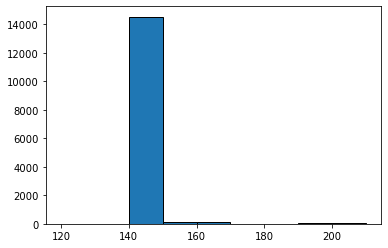

In [165]:
plt.hist(1/(laser_time_session[2:]-laser_time_session[:-2]),bins=[120,130,140,150,160,170,180,190,200,210],edgecolor='black')

In [166]:
laser_on_ind=np.argwhere(np.diff(laser_time_session)>1).ravel()+2
laser_on_time=laser_time_session[laser_on_ind]

#### 2. do laser trigger plot

In [167]:
savefolder='/cumulus/shijie/recording_pilot/isaac/analysis/20230601'

/tmp/ipykernel_2325831/702256409.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrows=3,gridspec_kw={'height_ratios': [10,1,1]},sharex=True,figsize=(15,8))


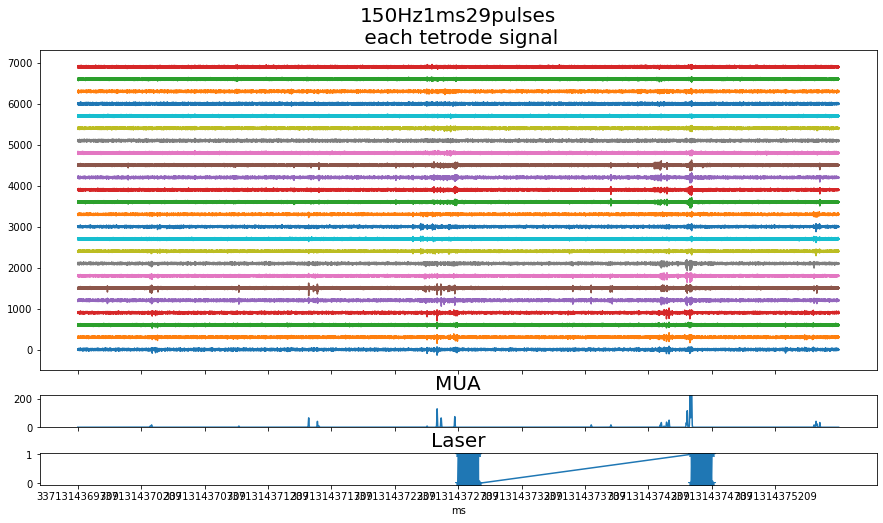

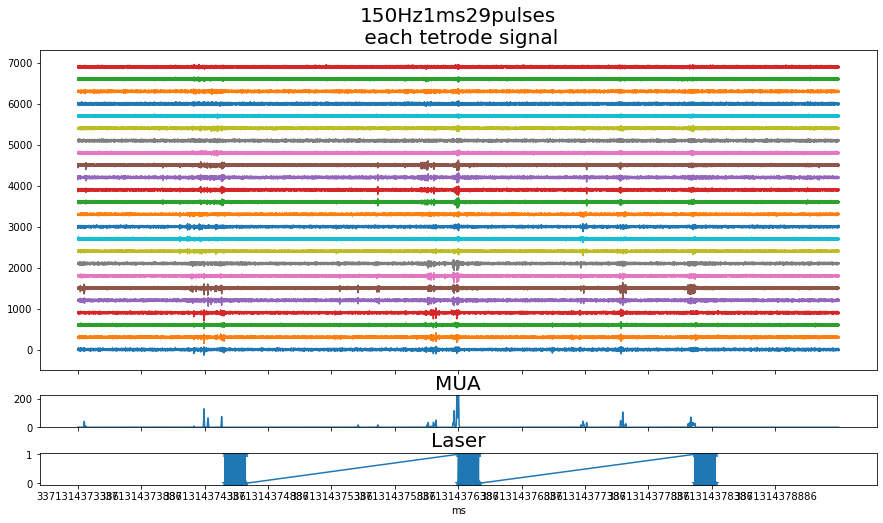

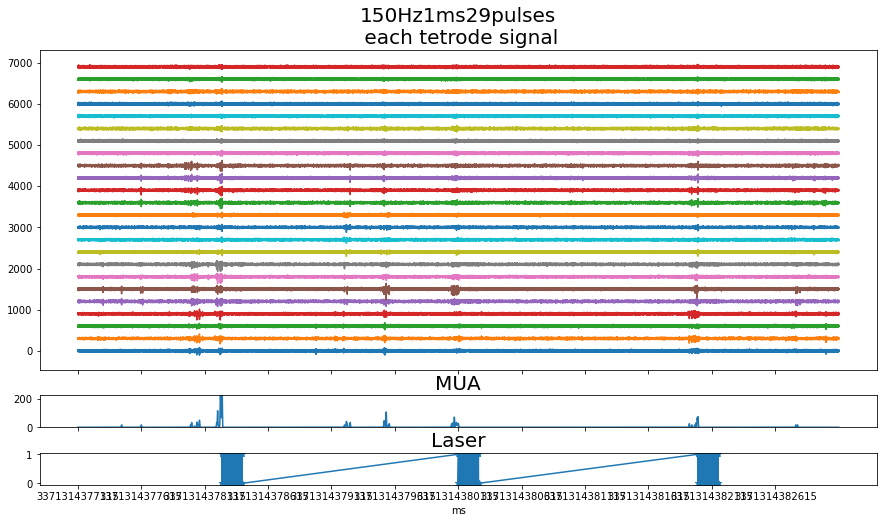

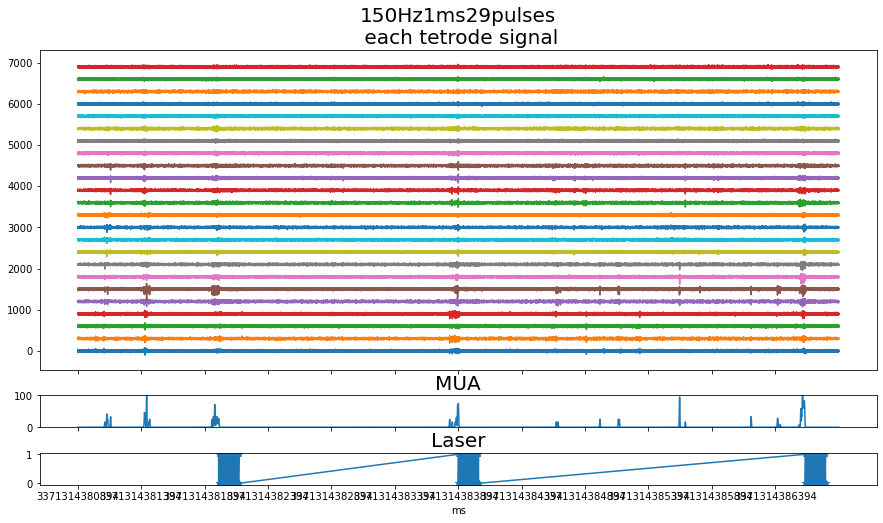

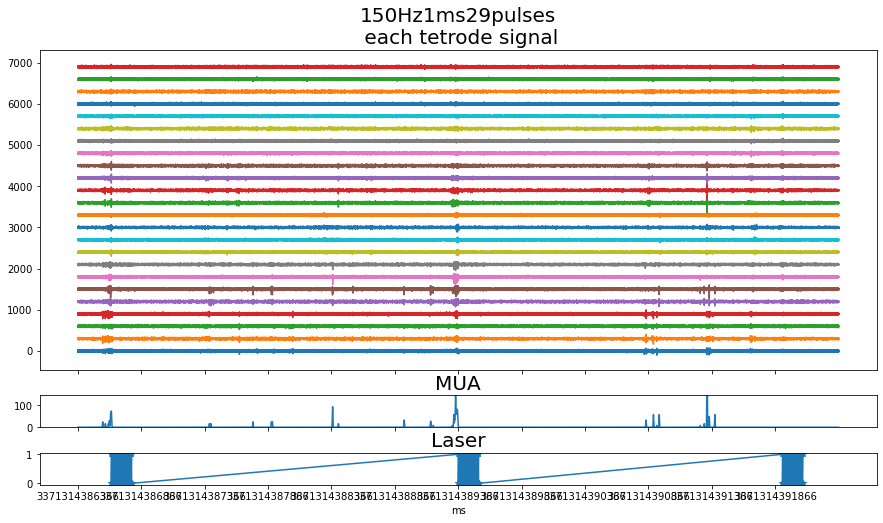

...

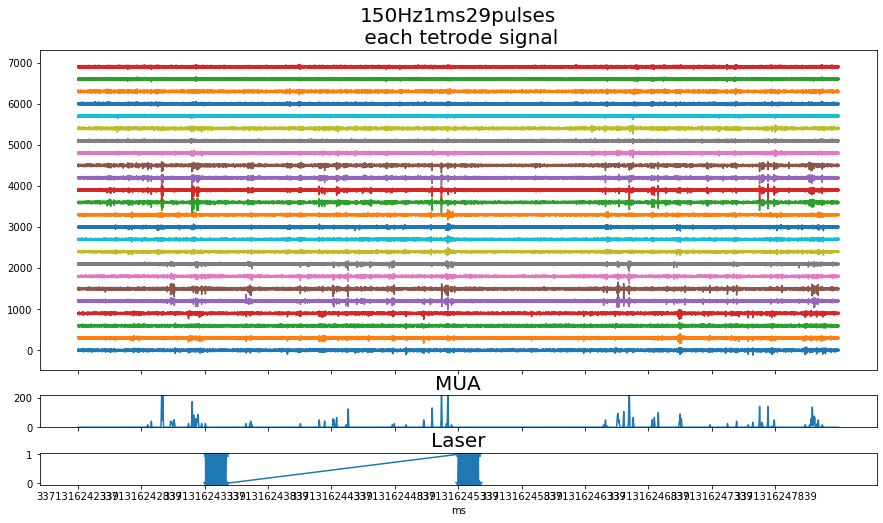

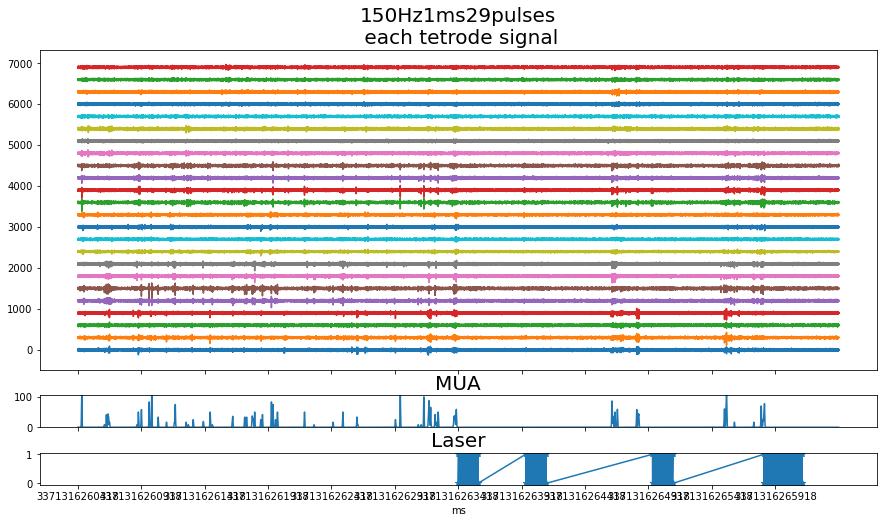

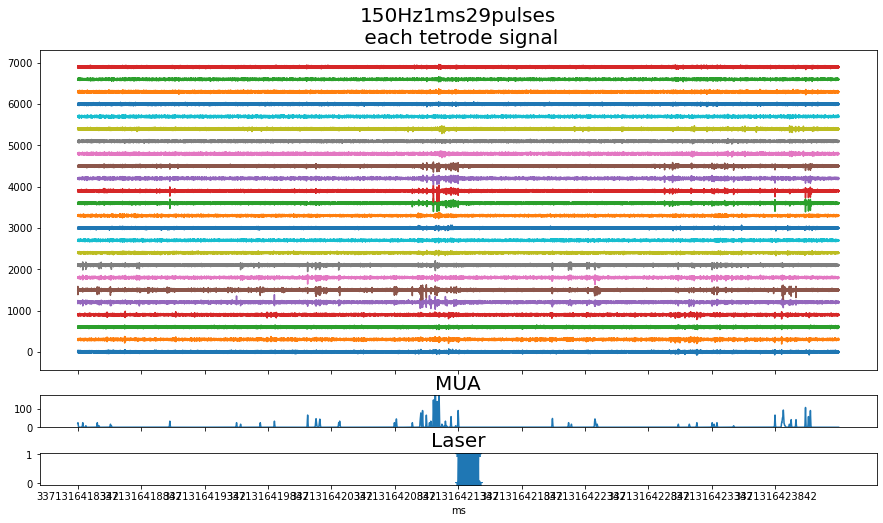

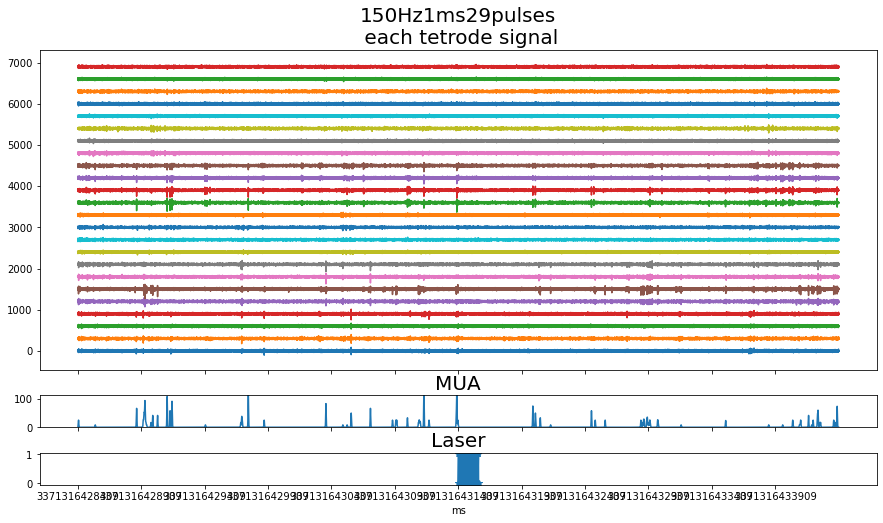

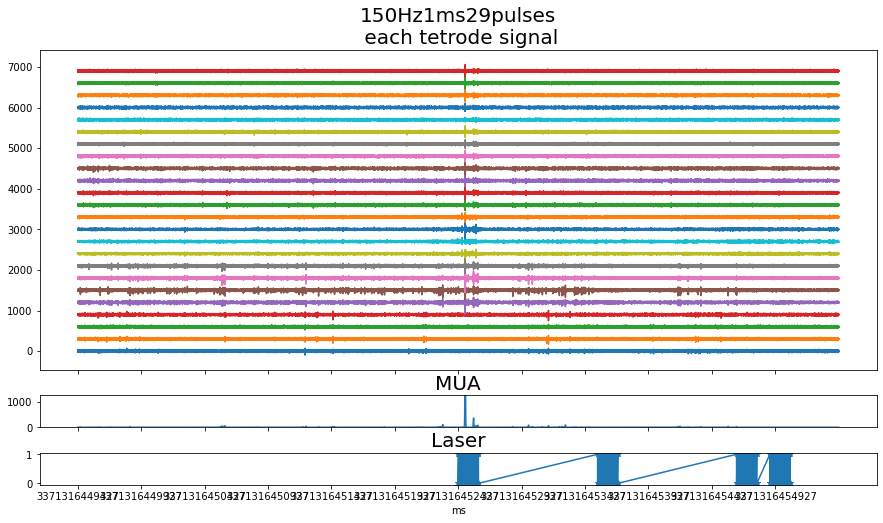

In [25]:
for l in range(len(laser_on_time)):
    delta_t=3 #in seconds
    t0=laser_on_time[l]-delta_t
    t1=laser_on_time[l]+delta_t
    plottimes=(t0,t1)

    '''
    get data
    '''
    # laser data
    laser_t_ind = np.argwhere(np.logical_and(laser_time >= plottimes[0], laser_time < plottimes[1])).ravel()
    laser_data_plot = laser_data[laser_t_ind].astype('int32')
    laser_time_plot = laser_time[laser_t_ind]

    # neural data
    neural_data=[]
    for tetrode in tetrodes:
        neural_time,neural_data_=get_one_tetrode_data(nwb_file_name,
                                                     tetrode,sort_interval_name,plottimes)
        neural_data.append(neural_data_)
    neural_data=np.hstack(neural_data)

    # MUA
    mua=get_multiunit_population_firing_rate(np.abs(neural_data)>=100,30000,smoothing_sigma=60/30000)

    '''
    plot
    '''
    fig, axes = plt.subplots(nrows=3,gridspec_kw={'height_ratios': [10,1,1]},sharex=True,figsize=(15,8))
    numtrodes=np.shape(neural_data)[1]
    for i in range(numtrodes):
        axes[0].plot(neural_time, neural_data[:,i]+i*300)
    axes[0].set_title(sort_interval_name[3:]+'\n each tetrode signal',fontsize=20)

    axes[1].plot(neural_time,mua)
    axes[1].set_ylim(0,np.quantile(mua,0.999))
    axes[1].set_title('MUA',fontsize=20)

    axes[2].plot(laser_time_plot,laser_data_plot,'*-')
    axes[2].set_title('Laser',fontsize=20)

    xticks=np.arange(plottimes[0],plottimes[1],0.5)
    axes[2].set_xticks(xticks)
    axes[2].set_xticklabels([int(i*1000) for i in xticks--(plottimes[0]+plottimes[1])/2])
    axes[2].set_xlabel('ms')
    
    if len(savefolder)>0:
        savename=sort_interval_name+'_laser_'+str(l)+'_'+str(delta_t)+'second_window'
        plt.savefig(os.path.join(savefolder,savename+'.png'),bbox_inches='tight',dpi=300)

#### 3. do laser trigger mua plot to get time course

In [168]:
np.shape(mua)

(38093603,)

In [218]:
MUA=[]
for l in range(len(laser_on_time)):
    delta_t=0.1 #in seconds
    t0=laser_on_time[l]-delta_t
    t1=laser_on_time[l]+delta_t
    plottimes=(t0,t1)

    '''
    get data
    '''
    # laser data
    laser_t_ind = np.argwhere(np.logical_and(laser_time >= plottimes[0], laser_time <= plottimes[1])).ravel()
    laser_data_plot = laser_data[laser_t_ind].astype('int32')
    laser_time_plot = laser_time[laser_t_ind]

    # neural data
    neural_data=[]
    for tetrode in tetrodes:
        neural_time,neural_data_=get_one_tetrode_data(nwb_file_name,
                                                     tetrode,sort_interval_name,plottimes)
        neural_data.append(neural_data_)
    neural_data=np.hstack(neural_data)

    # MUA
    mua=get_multiunit_population_firing_rate(np.abs(neural_data)>=100,30000,smoothing_sigma=60/30000)
    mua_max=np.quantile(mua,0.99)
    mua[mua>=mua_max]=mua_max
    MUA.append(mua)

In [219]:
length=np.min([len(MUA[i]) for i in range(len(MUA))])
MUA=np.vstack([MUA[i][:length] for i in range(len(MUA))])
MUA.shape

(104, 5999)

Text(0.5, 0.98, '01_200Hz1ms33pulses 0.1second window')

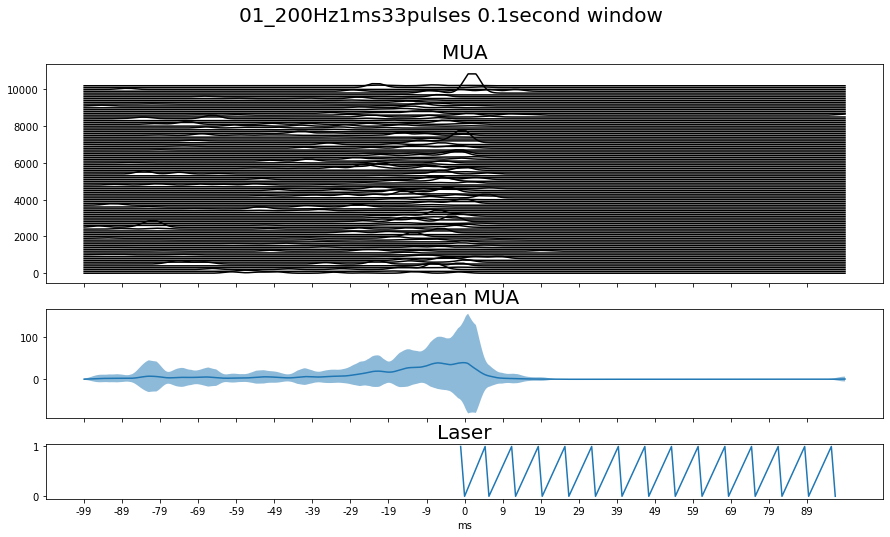

In [220]:
fig, axes = plt.subplots(nrows=3,gridspec_kw={'height_ratios': [4,2,1]},sharex=True,figsize=(15,8))
for i in range(MUA.shape[0]-1):
    axes[0].plot(neural_time[:length], MUA[i]+i*100,'k-')
axes[0].set_title('MUA',fontsize=20)

MUA_mean=np.mean(MUA,0)
MUA_std=np.std(MUA,0)
axes[1].plot(neural_time[:length],MUA_mean,'-')
axes[1].fill_between(neural_time[:length],MUA_mean-MUA_std,MUA_mean+MUA_std,alpha=0.5)
axes[1].set_title('mean MUA',fontsize=20)

axes[2].plot(laser_time_plot,laser_data_plot,'-')
axes[2].set_title('Laser',fontsize=20)

xticks=np.arange(plottimes[0],plottimes[1],0.01)
axes[2].set_xticks(xticks)
axes[2].set_xticklabels([int(i*1000) for i in xticks-(plottimes[0]+plottimes[1])/2])
axes[2].set_xlabel('ms')

if len(savefolder)>0:
    savename=sort_interval_name+' '+str(delta_t)+'second window'
    plt.savefig(os.path.join(savefolder,savename+'.png'),bbox_inches='tight',dpi=300)

plt.suptitle(savename,fontsize=20)

## D. ripple detection, threshold analysis

In [13]:
from spyglass.common import (IntervalPositionInfo, IntervalPositionInfoSelection, IntervalList, 
                             ElectrodeGroup, LFP, BrainRegion, LFPBand, Electrode)
import pynwb

#### 1. Ripple band 2.5sd threshold triggered spiking plot

In [14]:
ripple_nwb = (LFPBand & {'nwb_file_name': nwb_file_name,
                         'target_interval_list_name':run_session[0],
                         'filter_name':'Ripple 150-250 Hz'}).fetch_nwb()[0]
filtered_data=np.array(ripple_nwb['filtered_data'].data)
ripple_t=ripple_nwb['filtered_data'].timestamps
electrodes=ripple_nwb['filtered_data'].electrodes

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

In [15]:
# Consensus
ripple_consensus_trace = get_Kay_ripple_consensus_trace(
    filtered_data, ripple_nwb['lfp_band_sampling_rate'],smoothing_sigma=0.004)

# MUA 2 ms * 30 sample/ms
# mua=get_multiunit_population_firing_rate(np.abs(neural_data)>=100,30000,smoothing_sigma=60/30000)

In [175]:
offline_ripple=Gu_ripple_detector(ripple_t, filtered_data,
                                  np.zeros_like(ripple_t),ripple_nwb['lfp_band_sampling_rate'],
                                  zscore_threshold=2)

113.71860783516371


In [199]:
delta_t=0.08 #in seconds

MUA=[]
ripple_consensus=[]
Laser=[]
for l in range(len(offline_ripple)):
    t0=np.array(offline_ripple.start_time)[l]-delta_t
    t1=np.array(offline_ripple.start_time)[l]+0.05+delta_t
    plottimes=(t0,t1)

    '''
    get data
    '''
    # laser data
    lt_ind=np.argwhere(np.logical_and(laser_on_time >= plottimes[0], laser_on_time <= plottimes[1])).ravel()
    if len(lt_ind)>0:
        Laser.append(laser_on_time[lt_ind]-t0)
    else:
        continue
        Laser.append([])
    

    # neural data
    neural_data=[]
    for tetrode in tetrodes:
        neural_time,neural_data_=get_one_tetrode_data(nwb_file_name,
                                                     tetrode,sort_interval_name,plottimes)
        neural_data.append(neural_data_)
    neural_data=np.hstack(neural_data)

    # MUA
    mua=get_multiunit_population_firing_rate(np.abs(neural_data)>=100,30000,smoothing_sigma=60/30000)
    mua_max=np.quantile(mua,0.99)
    mua[mua>=mua_max]=mua_max
    MUA.append(mua)
    
    # Consensus
    ripple_t_ind = np.argwhere(np.logical_and(ripple_t >= plottimes[0], ripple_t < plottimes[1])).ravel()
    ripple_consensus.append(ripple_consensus_trace[ripple_t_ind])

In [200]:
length_MUA=np.min([len(MUA[i]) for i in range(len(MUA))])
length_RIP=np.min([len(ripple_consensus[i]) for i in range(len(ripple_consensus))])

MUA=np.vstack([MUA[i][:length_MUA] for i in range(len(MUA))])
RIP=np.vstack([ripple_consensus[i][:length_RIP] for i in range(len(ripple_consensus))])

Text(0.5, 0.98, '01_200Hz1ms33pulses 0.08second window')

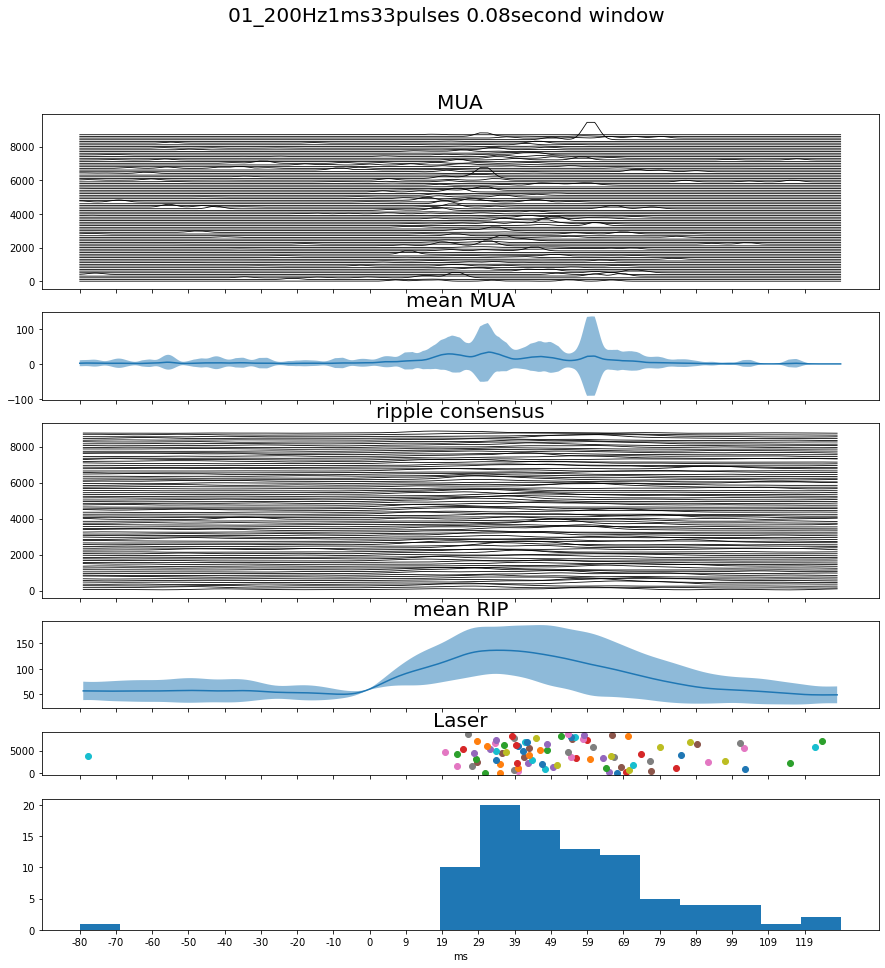

In [217]:
fig, axes = plt.subplots(nrows=6,gridspec_kw={'height_ratios': [4,2,4,2,1,3]},sharex=True,figsize=(15,15))

# MUA
for i in range(MUA.shape[0]):
    axes[0].plot(neural_time[:length_MUA], MUA[i]+i*100,'k-',linewidth=0.8)
axes[0].set_title('MUA',fontsize=20)

MUA_mean=np.mean(MUA,0)
MUA_std=np.std(MUA,0)
axes[1].plot(neural_time[:length_MUA],MUA_mean,'-')
axes[1].fill_between(neural_time[:length_MUA],MUA_mean-MUA_std,MUA_mean+MUA_std,alpha=0.5)
axes[1].set_title('mean MUA',fontsize=20)

# RIP
for i in range(RIP.shape[0]):
    axes[2].plot(ripple_t[ripple_t_ind][:length_RIP], RIP[i]+i*100,'k-',linewidth=0.8)
axes[2].set_title('ripple consensus',fontsize=20)

RIP_mean=np.mean(RIP,0)
RIP_std=np.std(RIP,0)
axes[3].plot(ripple_t[ripple_t_ind][:length_RIP],RIP_mean,'-')
axes[3].fill_between(ripple_t[ripple_t_ind][:length_RIP],RIP_mean-RIP_std,RIP_mean+RIP_std,alpha=0.5)
axes[3].set_title('mean RIP',fontsize=20)


for i in range(len(Laser)):
    axes[4].scatter(Laser[i]+neural_time[:length_MUA][0], i*100)
axes[4].set_title('Laser',fontsize=20)


plottimes=(neural_time[:length_MUA][0],neural_time[:length_MUA][-1])
xticks=np.arange(plottimes[0],plottimes[1],0.01)
axes[4].set_xticks(xticks)
axes[4].set_xticklabels([int(i*1000) for i in xticks-plottimes[0]-delta_t])

axes[5].hist(np.array(Laser)+neural_time[:length_MUA][0],
             bins=np.linspace(plottimes[0],plottimes[1],20))
axes[5].set_xlabel('ms')

if len(savefolder)>0:
    savename=sort_interval_name+' '+str(delta_t)+'second window'
    plt.savefig(os.path.join(savefolder,savename+'.png'),bbox_inches='tight',dpi=300)

plt.suptitle(savename,fontsize=20)

### Investigate how ripple band std depends on the number of electrodes selected.

In [16]:
filtered_data.shape

(1269785, 27)

In [22]:
subNs=[2,5,10,20,25]
thresholds=np.zeros((5,len(subNs)))
for subNi in range(len(subNs)):
    subN=subNs[subNi]
    for i in range(1):
        subInd=np.random.choice(filtered_data.shape[1], subN, replace=False)
        subConsensus= get_Kay_ripple_consensus_trace(
            filtered_data[:,subInd], ripple_nwb['lfp_band_sampling_rate'],smoothing_sigma=0.004)
        thresholds[i,subNi]=(np.nanmean(subConsensus)+2*np.nanstd(subConsensus))

/tmp/ipykernel_282913/162918372.py:11: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(ripple_consensus_trace)


In [28]:
subNs=[2,5,10,20,25]
offline_ripples=[]
for subNi in range(len(subNs)):
    subN=subNs[subNi]
    for i in range(1):
        subInd=np.random.choice(filtered_data.shape[1], subN, replace=False)
        
        offline_ripple=Gu_ripple_detector(ripple_t, filtered_data[:,subInd],
                                          np.zeros_like(ripple_t),ripple_nwb['lfp_band_sampling_rate'],
                                          zscore_threshold=1)
        offline_ripples.append(offline_ripple)

25.684277831363914
35.92012424813965
54.50103915310174
74.39431051754919
84.45855468549232


In [29]:
print([len(offline_ripple) for offline_ripple in offline_ripples])

[2607, 2493, 2458, 2511, 2478]


Text(0, 0.5, '2 SD threshold')

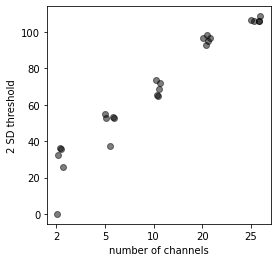

In [23]:
fig, axes = plt.subplots(nrows=1,ncols=1,figsize=(4,4))

for subNi in range(len(subNs)):
    for i in range(5):
        axes.scatter(subNi+np.random.uniform()*0.2,thresholds[i,subNi],color='k',alpha=0.5)
        
xticks=np.arange(len(subNs))
axes.set_xticks(xticks)
axes.set_xticklabels(subNs)
axes.set_xlabel('number of channels')
axes.set_ylabel('2 SD threshold')

### Investigate how the number of electrodes meeting criteria matches consensus criterion

In [762]:
def threshold_Gu(is_above_threshold, time, minimum_duration=0.015,mean=0):
    '''Standardize the data and determine whether it is above a given
    number.



    '''

    return extend_threshold_to_mean(
        is_above_threshold, is_above_threshold, time,
        minimum_duration=minimum_duration)

In [748]:
# Use the mean estimated from before as the threshold gamma
gamma=np.mean(thresholds,0)[-1]*subNs[-1]
print(gamma)

107.9510292562569


In [763]:
# find when the consensus cross the threshold
candidate_ripple_times=threshold_Gu(ripple_consensus_trace>=gamma, 
                                    ripple_t, minimum_duration=0.015)

In [771]:
candidate_ripple_times[0]

(1685655735.857087, 1685655735.900087)

In [ ]:
subNs=[2,5,10,20,25]
FP_all=np.zeros((2,len(subNs)))
FN_all=np.zeros((2,len(subNs)))

for subNi in range(len(subNs)):
    subN=subNs[subNi]
    for i in range(2):
        ripple_consensus_trace_N=filtered_data[:,np.random.choice(filtered_data.shape[1], subN, replace=False)]
        candidate_ripple_times_N=threshold_Gu(np.sum(ripple_consensus_trace_N>=gamma/subN,axis=1)>0,
                                              ripple_t,minimum_duration=0.0)
        mean_candidate_ripple_times_N=np.mean(np.array(candidate_ripple_times_N),axis=1)
        mean_candidate_ripple_times=np.mean(np.array(candidate_ripple_times),axis=1)

        # find false negative and false positive
        TP=[];
        for r_times in candidate_ripple_times:
            TP.append(np.sum(np.logical_and(mean_candidate_ripple_times_N>=r_times[0],mean_candidate_ripple_times_N<r_times[1]))>0)
        TP=np.array(TP)
        FN_rate=1-np.sum(TP==1)/len(TP)
        FN_all[i,subNi]=FN_rate

        FP=[];
        for r_times in candidate_ripple_times_N:
            FP.append(np.sum(np.logical_and(mean_candidate_ripple_times>=r_times[0],mean_candidate_ripple_times<r_times[1]))==0)
        FP=np.array(FP)
        FP_rate=np.sum(FP==1)/len(FP)
        FP_all[i,subNi]=FP_rate

In [814]:
subNi

1

In [809]:
fig, axes = plt.subplots(nrows=1,ncols=1,figsize=(4,4))

for subNi in range(len(subNs)):
    for i in range(5):
        axes.scatter(subNi+np.random.uniform()*0.2,FP[i,subNi],color='k',alpha=0.5)
        
xticks=np.arange(len(subNs))
axes.set_xticks(xticks)
axes.set_xticklabels(subNs)
axes.set_xlabel('number of channels')
axes.set_ylabel('2 SD threshold')
axes.set_title('False Positive Detected Ripple vs number of tetrode')